In [2]:
import numpy as np
import pandas as pd
import torch 
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

### Part 3.a.

In [3]:
files = ['./Shakespeare.txt', './WarAndPeace_Tolstoy.txt','./PrideAndPrejudice_JaneAusten.txt']#'./MurderOnLinks_Agatha.txt',
a=[]
for file in files:
    a = a +[open(file, encoding = 'utf-8').read()]
print(len(a), len(a[0]), len(a[1]), len(a[2]))

3 5379019 3227557 748151


In [3]:
a[0][:100]

'\ufeffThe Project Gutenberg eBook of The Complete Works of William Shakespeare\n    \nThis ebook is for the'

##### One-hot-encoding using only numpy for a sample of the first book

In [4]:

characters = set(a)
token_index = dict(zip(characters, range(1, len(characters) + 1)))
results = np.zeros((len(a),  max(token_index.values()) + 1))
for i, sample in enumerate(a[:10]):
    print(sample)
    index = token_index.get(sample)
    results[i, index] = 1.
results[:10]
    

The Project Gutenberg eBook of The Complete Works of William Shakespeare
    
This ebook is for the use of anyone anywhere in the United States and
most other parts of the world at no cost and with almost no restrictions
whatsoever. You may copy it, give it away or re-use it under the terms
of the Project Gutenberg License included with this ebook or online
at www.gutenberg.org. If you are not located in the United States,
you will have to check the laws of the country where you are located
before using this eBook.

Title: The Complete Works of William Shakespeare


Author: William Shakespeare

Release date: January 1, 1994 [eBook #100]
                Most recently updated: October 11, 2023

Language: English



*** START OF THE PROJECT GUTENBERG EBOOK THE COMPLETE WORKS OF WILLIAM SHAKESPEARE ***



The Complete Works of William Shakespeare

by William Shakespeare




                    Contents

    THE SONNETS
    ALL’S WELL THAT ENDS WELL
    THE TRAGEDY OF ANTONY AND CLEOPATRA
 

array([[0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [41]:
list(token_index.keys())[np.argmax(results[0])-1]

'\ufeff'

In [42]:
list(token_index.keys())[np.argmax(results[1])-1]

'T'

##### Encoding using ordinal and one-hot encoder of sklearn - First create a vocab and fit the encoders

In [4]:
characters = set(a[0]).union(set(a[1])).union(set(a[2]))
len(list(characters)), list(characters)[:10]

(123, ['C', ']', 'L', 'S', '\n', 'í', 'k', '2', '?', 'E'])

In [5]:
%%time
### converting the strings to list of characters
list_char = []
for j in range(len(a)): ## iterating over 3 books
    one_book_char_list = []
    for i, sample in enumerate(a[j]):
        one_book_char_list.append(sample)
    list_char += [one_book_char_list]
len(list_char), len(list_char[0]), len(list_char[1]), len(list_char[2])

CPU times: total: 234 ms
Wall time: 716 ms


(3, 5379019, 3227557, 748151)

##### OneHotEncoder and OrdinalEncoder are trained on the vocabulary

In [6]:
ord_enc = OrdinalEncoder()
vocab_y_ord = ord_enc.fit_transform(np.array(list(characters)).reshape(-1,1))
vocab_y_ord[:10], np.array(list(characters)).reshape(-1,1)[:10]

(array([[ 32.],
        [ 57.],
        [ 41.],
        [ 48.],
        [  1.],
        [104.],
        [ 70.],
        [ 18.],
        [ 29.],
        [ 34.]]),
 array([['C'],
        [']'],
        ['L'],
        ['S'],
        ['\n'],
        ['í'],
        ['k'],
        ['2'],
        ['?'],
        ['E']], dtype='<U1'))

In [7]:
onehot_enc = OneHotEncoder(sparse_output=False, sparse=False)
vocab_y_onehot = onehot_enc.fit_transform(vocab_y_ord)
vocab_y_onehot.shape, vocab_y_onehot[0].shape, len(list(characters))

c:\Users\royin\anaconda3\envs\pytorch-tlio\lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


((123, 123), (123,), 123)

##### Creating train and test split - 80/20 per book 

In [8]:
train_x = []
test_x = []
for i in range(len(list_char)):
    train_end_index = int(0.8*len(list_char[i]))
    train_x += [list_char[i][200:train_end_index]]
    test_x += [list_char[i][train_end_index:]]
    print(len(list_char[i]), len(train_x[i]), len(test_x[i]), len(train_x[i])/len(list_char[i]), len(test_x[i])/len(list_char[i]))

print(len(train_x), len(test_x))

5379019 4303015 1075804 0.7999627813175599 0.20000003718150094
3227557 2581845 645512 0.7999378477281733 0.20000018589911814
748151 598320 149631 0.7997316049834859 0.20000106930285463
3 3


In [8]:
4303215/598520 , 2582045/598520 

(7.189759740693711, 4.3140496558176835)

In [9]:
def get_embedding(text): ## text is a list of characters
    return np.squeeze(onehot_enc.transform(ord_enc.transform(np.array(text).reshape((-1,1)))))

In [11]:
%%time
## train dataset
### creating more batches of equal sequence length based on lowest len of the three books for train and test
seq_len = 32
min_seq_len = min(len(train_x[0]), len(train_x[1]), len(train_x[2]))
nbatch = min_seq_len//(seq_len+1) ## trimming data that overflows from batch size 32 for each seq
min_seq_len = nbatch*(seq_len+1)
final_train_x = []
for i in range(len(train_x)):
    for j in range(0, len(train_x[i]), min_seq_len):
        end_j = j+min_seq_len
        if end_j > len(train_x[i]): ## ignoring sequences that have length less that min_seq_len
            continue
        final_train_x += [get_embedding(train_x[i][j: end_j])] ## performing the encoding
len(final_train_x), len(final_train_x[0])

CPU times: total: 1.12 s
Wall time: 4.48 s


(12, 598290)

In [12]:
final_train_x = np.array(final_train_x)
final_train_x.shape, final_train_x[0,:2]

((12, 598290, 123),
 array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [13]:
598290/33

18130.0

In [14]:
n=10
final_train_x = final_train_x.reshape((final_train_x.shape[0]*n, int(final_train_x.shape[1]/((seq_len+1)*n))*(seq_len+1), final_train_x.shape[2]))
final_train_x.shape

(120, 59829, 123)

In [15]:
%%time
## validation dataset
### creating more batches of equal sequence length based on lowest len of the three books for train and test
min_seq_len = min(len(test_x[0]), len(test_x[1]), len(test_x[2]))
nbatch = min_seq_len//(seq_len+1) ## trimming data that overflows from batch size 32 for each seq
min_seq_len = nbatch*(seq_len+1)
final_test_x = []
for i in range(len(test_x)):
    for j in range(0, len(test_x[i]), min_seq_len):
        end_j = j+min_seq_len
        if end_j > len(test_x[i]): ## ignoring sequences that have length less that min_seq_len
            continue
        final_test_x += [get_embedding(test_x[i][j: end_j])] ## performing the encoding
len(final_test_x), len(final_test_x[0])

CPU times: total: 562 ms
Wall time: 1.44 s


(12, 149622)

In [16]:
final_test_x = np.array(final_test_x)
final_test_x.shape, final_test_x[0,:2]

((12, 149622, 123),
 array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [17]:
np.isnan(final_train_x).sum()

0

In [18]:
np.isnan(final_test_x).sum()

0

In [19]:
def get_batch(source, i):
    data = source[:,i:i+seq_len, :]
    target = source[:,i+1:i+1+seq_len,:]
    return data, target

In [20]:
data, target = get_batch(final_train_x, 0) ## testing the get_batch_function
data.shape, target.shape

((120, 32, 123), (120, 32, 123))

### Part 3.b

In [10]:
import torch.nn as nn
import torch.nn.functional as F

In [22]:
### Defining the RNN model
class RNNModel(nn.Module):
    """Container module with a recurrent module, and a decoder."""

    def __init__(self, ntoken, ninp, nhid, nlayers, dropout=0.5, tie_weights=False):
        super(RNNModel, self).__init__()
        self.ntoken = ntoken
        self.drop = nn.Dropout(dropout)
        self.rnn = nn.RNN(ninp, nhid, nlayers, nonlinearity='tanh', batch_first = True)
        self.decoder = nn.Linear(nhid, ntoken)

        # Optionally tie weights as in:
        # "Using the Output Embedding to Improve Language Models" (Press & Wolf 2016)
        # https://arxiv.org/abs/1608.05859
        # and
        # "Tying Word Vectors and Word Classifiers: A Loss Framework for Language Modeling" (Inan et al. 2016)
        # https://arxiv.org/abs/1611.01462
        if tie_weights:
            if nhid != ninp:
                raise ValueError('When using the tied flag, nhid must be equal to emsize')
            self.decoder.weight = self.encoder.weight

        self.init_weights()

        self.nhid = nhid
        self.nlayers = nlayers

    def init_weights(self):
        initrange = 0.1
        nn.init.zeros_(self.decoder.bias)
        nn.init.uniform_(self.decoder.weight, -initrange, initrange)

    def forward(self, input, hidden):
        output, hidden = self.rnn(input, hidden)
        output = self.drop(output)
        decoded = self.decoder(output)
        decoded = decoded.view(-1, self.ntoken)
        return F.log_softmax(decoded, dim=1), hidden

    def init_hidden(self, bsz):
        weight = next(self.parameters())
        return weight.new_zeros(self.nlayers, bsz, self.nhid)

In [23]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
device

device(type='cuda')

In [24]:
hidden = 200
n_layers = 1
ntokens = len(characters)
model = RNNModel(ntokens, ntokens, hidden, n_layers).to(device)

In [25]:
import time
import math

In [26]:
def repackage_hidden(h):
    """Wraps hidden states in new Tensors, to detach them from their history."""

    if isinstance(h, torch.Tensor):
        return h.detach()
    else:
        return tuple(repackage_hidden(v) for v in h)

In [27]:
criterion = nn.NLLLoss()

In [28]:
bsz = final_train_x.shape[0]
def train(train_loss_list, optimizer, train_acc_list):
    # Turn on training mode which enables dropout.
    model.train()
    accuracy=0
    total_loss = 0.
    start_time = time.time()
    clip = 0.25 ##default
    hidden = model.init_hidden(bsz)
    for op_params in optimizer.param_groups:
        lr = op_params['lr']
    for batch, i in enumerate(range(0, len(final_train_x[0])-seq_len, seq_len)):

        # if batch % 4000 == 0 and batch>0:
        #    for op_params in optimizer.param_groups:
        #         op_params['lr'] = op_params['lr'] * 0.8
        #         lr = op_params['lr']

        data, targets = get_batch(final_train_x, i)
        data = torch.from_numpy(data).type(torch.FloatTensor).to(device)
        targets = torch.from_numpy(targets).type(torch.FloatTensor).to(device)
        _,labels=torch.max(targets.view(-1,ntokens),1)
        # Starting each batch, we detach the hidden state from how it was previously produced.
        # If we didn't, the model would try backpropagating all the way to start of the dataset.
        
        hidden = repackage_hidden(hidden)
        output, hidden = model(data, hidden)
        loss = criterion(output, labels)
        optimizer.zero_grad()
        loss.backward()


        # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        # for p in model.parameters():
        #     p.data.add_(p.grad, alpha=-lr)
        _,pred=torch.max(output.view(-1,ntokens),1)
        accuracy += (pred==labels).sum().item()
        

        total_loss += loss.item()
        optimizer.step()
        if batch % 50 == 0 and batch > 0:
            cur_loss = total_loss / 50
            elapsed = time.time() - start_time
            accuracy = accuracy/(len(labels)*50)
            print('| epoch {:3d} | {:5d}/{:5d} batches | lr {:02.2f} | ms/batch {:5.2f} | '
                    'loss {:5.2f} | ppl {:8.2f}| accuracy {:3f}'.format(
                epoch, batch, len(final_train_x) // seq_len, lr,
                elapsed * 1000 / 10, cur_loss, math.exp(cur_loss), accuracy))
            train_loss_list += [cur_loss]
            train_acc_list += [accuracy]
            total_loss = 0
            accuracy = 0
            start_time = time.time()
    return train_loss_list, train_acc_list


In [29]:
best_val_loss = None

In [31]:
def evaluate(data_source, eval_loss_list, eval_acc_list):
    # Turn on evaluation mode which disables dropout.
    bsz = data_source.shape[0]
    model.eval()
    total_loss = 0.
    hidden = model.init_hidden(bsz)
    accuracy=0
    with torch.no_grad():
        for i in range(0, len(data_source[0])- seq_len, seq_len):
            data, targets = get_batch(data_source, i)
            data = torch.from_numpy(data).type(torch.FloatTensor).to(device)
            targets = torch.from_numpy(targets).type(torch.FloatTensor).to(device)
            _,labels=torch.max(targets.view(-1,ntokens),1)
            output, hidden = model(data, hidden)
            hidden = repackage_hidden(hidden)
            loss = criterion(output, labels)
            total_loss += seq_len*bsz * loss.item()

            _,pred=torch.max(output.view(-1,ntokens),1)
            accuracy += (pred==labels).sum().item()

    accuracy = accuracy/((len(data_source[0])- seq_len)*bsz)
    eval_acc_list += [accuracy]
    total_loss = total_loss / ((len(data_source[0])- seq_len)*bsz)
    eval_loss_list += [total_loss]
    return total_loss, eval_loss_list, accuracy, eval_acc_list


In [32]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [33]:
epochs = 10
train_loss_list = []
eval_loss_list = []
train_acc_list = []
eval_acc_list = []
for epoch in range(1, epochs+1):
        epoch_start_time = time.time()
        train_loss_list, train_acc_list = train(train_loss_list, optimizer, train_acc_list)
        val_loss, eval_loss_list, accuracy, eval_acc_list = evaluate(final_test_x, eval_loss_list, eval_acc_list)
        print('-' * 89)
        print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.2f}| accuracy {:.2f}'.format(epoch, (time.time() - epoch_start_time),
                                           val_loss, accuracy))
        print('-' * 89)
        # # Save the model if the validation loss is the best we've seen so far.
        # if not best_val_loss or val_loss < best_val_loss:
        #     with open(args.save, 'wb') as f:
        #         torch.save(model, f)
        #     best_val_loss = val_loss
        # else:
        #     # Anneal the learning rate if no improvement has been seen in the validation dataset.
        #     lr /= 4.0

| epoch   1 |    50/    3 batches | lr 0.00 | ms/batch 103.30 | loss  3.63 | ppl    37.79| accuracy 0.140036
| epoch   1 |   100/    3 batches | lr 0.00 | ms/batch 75.06 | loss  3.04 | ppl    20.88| accuracy 0.212531
| epoch   1 |   150/    3 batches | lr 0.00 | ms/batch 69.05 | loss  2.77 | ppl    16.01| accuracy 0.268292
| epoch   1 |   200/    3 batches | lr 0.00 | ms/batch 69.02 | loss  2.64 | ppl    13.96| accuracy 0.293438
| epoch   1 |   250/    3 batches | lr 0.00 | ms/batch 68.61 | loss  2.55 | ppl    12.84| accuracy 0.308599
| epoch   1 |   300/    3 batches | lr 0.00 | ms/batch 67.41 | loss  2.50 | ppl    12.14| accuracy 0.317286
| epoch   1 |   350/    3 batches | lr 0.00 | ms/batch 68.30 | loss  2.45 | ppl    11.63| accuracy 0.323604
| epoch   1 |   400/    3 batches | lr 0.00 | ms/batch 66.35 | loss  2.42 | ppl    11.20| accuracy 0.330531
| epoch   1 |   450/    3 batches | lr 0.00 | ms/batch 68.20 | loss  2.40 | ppl    10.98| accuracy 0.334047
| epoch   1 |   500/    3 b

In [44]:
np.save('train_loss_list_hw3_p3.npy', np.array(train_loss_list))
np.save('train_acc_list_hw3_p3.npy', np.array(train_acc_list))
np.save('eval_loss_list_hw3_p3.npy', np.array(eval_loss_list))
np.save('eval_acc_list_hw3_p3.npy', np.array(eval_acc_list))

In [45]:
len(train_loss_list), len(train_acc_list), len(eval_loss_list), len(eval_acc_list)

(370, 370, 10, 10)

In [46]:
np.min(train_loss_list), np.max(train_acc_list) 

(1.916066677570343, 0.45155208333333335)

In [47]:
np.min(eval_loss_list), np.max(eval_acc_list) 

(1.892388531281768, 0.45227733582904384)

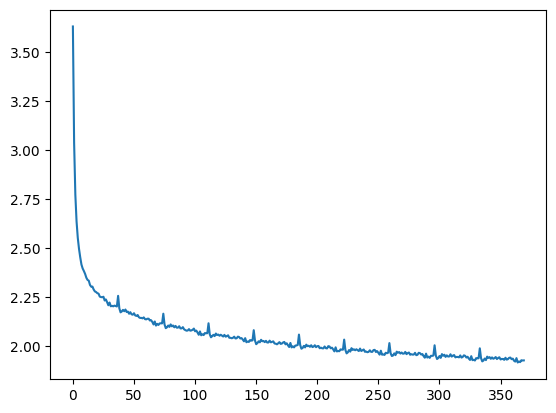

In [48]:
import matplotlib.pyplot as plt
plt.plot(train_loss_list)

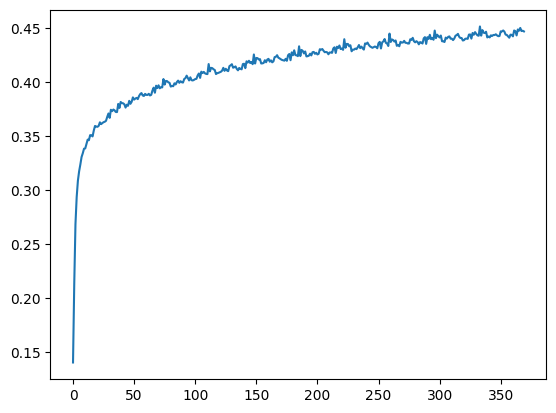

In [49]:
plt.plot(train_acc_list)

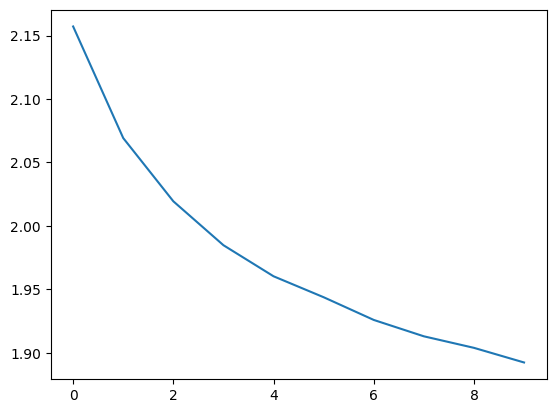

In [50]:
plt.plot(eval_loss_list)

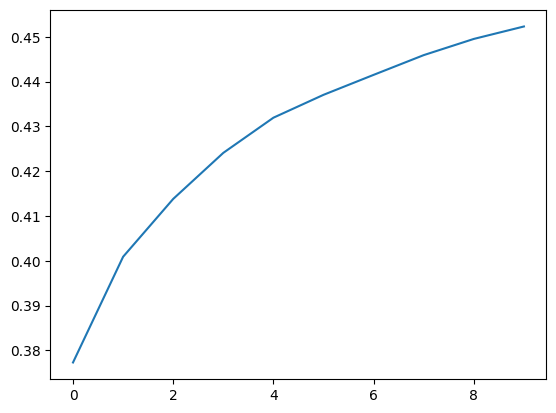

In [51]:
plt.plot(eval_acc_list)

In [66]:
pred_sent = 'o'
current_char = [pred_sent]
model.eval()
hidden = model.init_hidden(1)
embed = get_embedding(current_char)
for i in range(seq_len):
    data = torch.from_numpy(embed.reshape((1,1,-1))).type(torch.FloatTensor).to(device)
    output, hidden = model(data, hidden)
    _,pred=torch.max(output.view(-1,ntokens),1)
    embed = onehot_enc.transform(pred.cpu().numpy().reshape((-1,1)))
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)
    

on the roust of the some and and 


In [76]:
pred_sent = 't'
current_char = [pred_sent]
model.eval()
hidden = model.init_hidden(1)
embed = get_embedding(current_char)
for i in range(seq_len):
    data = torch.from_numpy(embed.reshape((1,1,-1))).type(torch.FloatTensor).to(device)
    output, hidden = model(data, hidden)
    _,pred=torch.max(output.view(-1,ntokens),1)
    embed = onehot_enc.transform(pred.cpu().numpy().reshape((-1,1)))
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)
    

ther with the sound and she said 


In [67]:
torch.save(model, 'finalmodel_hw3_p3.pt')

##### When I store loss for each iteration instead of running mean over 50 iterations, the plot is as shown below

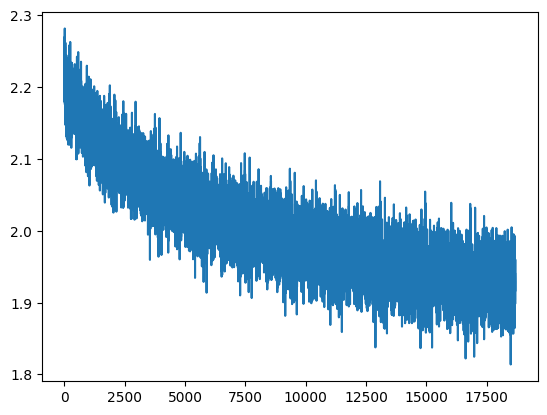

In [41]:
import matplotlib.pyplot as plt
plt.plot(train_loss_list)

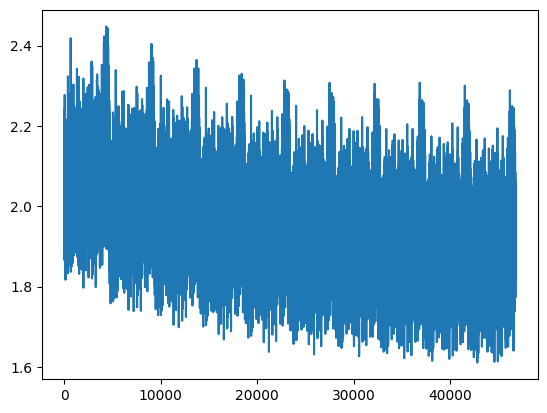

In [43]:
plt.plot(eval_loss_list)

### Part 3.c

In [11]:
%%time
## train dataset
### creating more batches of equal sequence length based on lowest len of the three books for train and test
seq_len = 128
min_seq_len = min(len(train_x[0]), len(train_x[1]), len(train_x[2]))
nbatch = min_seq_len//((seq_len)+1) ## trimming data that overflows from batch size 32 for each seq
min_seq_len = nbatch*(seq_len+1)
final_train_x = []
for i in range(len(train_x)):
    for j in range(0, len(train_x[i]),int(min_seq_len)):
        end_j = j+min_seq_len
        if end_j > len(train_x[i]): ## ignoring sequences that have length less that min_seq_len
            continue
        final_train_x += [get_embedding(train_x[i][j: end_j])] ## performing the ordinal encoding
len(final_train_x), len(final_train_x[0])

CPU times: total: 797 ms
Wall time: 4.45 s


(12, 598302)

In [11]:
30*598273

17948190

In [12]:
final_train_x = np.array(final_train_x)
final_train_x.shape, final_train_x[0,:2]

((12, 598302, 123),
 array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [13]:
598302/(129*6)

773.0

In [14]:
n=6
final_train_x = final_train_x.reshape((final_train_x.shape[0]*n, int(final_train_x.shape[1]/((seq_len+1)*n))*(seq_len+1), final_train_x.shape[2]))
final_train_x.shape

(72, 99717, 123)

In [15]:
%%time
## validation dataset
### creating more batches of equal sequence length based on lowest len of the three books for train and test
min_seq_len = min(len(test_x[0]), len(test_x[1]), len(test_x[2]))
nbatch = min_seq_len//(seq_len) ## trimming data that overflows from batch size 32 for each seq
min_seq_len = nbatch*(seq_len) +1
final_test_x = []
for i in range(len(test_x)):
    for j in range(0, len(test_x[i]), min_seq_len):
        end_j = j+min_seq_len
        if end_j > len(test_x[i]): ## ignoring sequences that have length less that min_seq_len
            continue
        final_test_x += [get_embedding(test_x[i][j: end_j])] ## performing the ordinal encoding
len(final_test_x), len(final_test_x[0])

CPU times: total: 266 ms
Wall time: 1.19 s


(12, 149505)

In [16]:
final_test_x = np.array(final_test_x)
final_test_x.shape, final_test_x[0,:2]

((12, 149505, 123),
 array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [17]:
def get_batch(source, i):
    data = source[:,i:i+seq_len]
    target = source[:,i+1:i+1+seq_len]
    return data, target

In [18]:
data, target = get_batch(final_train_x, 0) ## testing the get_batch_function
data.shape, target.shape

((72, 128, 123), (72, 128, 123))

In [19]:
class PositionalEncoding(nn.Module):
    r"""Inject some information about the relative or absolute position of the tokens in the sequence.
        The positional encodings have the same dimension as the embeddings, so that the two can be summed.
        Here, we use sine and cosine functions of different frequencies.
    .. math:
        \text{PosEncoder}(pos, 2i) = sin(pos/10000^(2i/d_model))
        \text{PosEncoder}(pos, 2i+1) = cos(pos/10000^(2i/d_model))
        \text{where pos is the word position and i is the embed idx)
    Args:
        d_model: the embed dim (required).
        dropout: the dropout value (default=0.1).
        max_len: the max. length of the incoming sequence (default=5000).
    Examples:
        >>> pos_encoder = PositionalEncoding(d_model)
    """

    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        r"""Inputs of forward function
        Args:
            x: the sequence fed to the positional encoder model (required).
        Shape:
            x: [sequence length, batch size, embed dim]
            output: [sequence length, batch size, embed dim]
        Examples:
            >>> output = pos_encoder(x)
        """

        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

In [29]:
class TransformerModel(nn.Transformer):
    """Container module with an encoder, a recurrent or transformer module, and a decoder."""

    def __init__(self, ntoken, ninp, nhead, nhid, nlayers, dropout=0.5):
        super(TransformerModel, self).__init__(d_model=ninp, nhead=nhead, dim_feedforward=nhid, num_encoder_layers=nlayers)
        self.model_type = 'Transformer'
        self.src_mask = None
        # self.pos_encoder = PositionalEncoding(ninp, dropout)

        self.input_emb = nn.Embedding(ntoken, ninp)
        self.ninp = ninp
        self.decoder = nn.Linear(ninp, ntoken)
        self.ntoken = ntoken

        self.init_weights()

    def _generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def init_weights(self):
        initrange = 0.1
        nn.init.uniform_(self.input_emb.weight, -initrange, initrange)
        nn.init.zeros_(self.decoder.bias)
        nn.init.uniform_(self.decoder.weight, -initrange, initrange)

    def forward(self, src, has_mask=True):
        # if has_mask:
        #     device = src.device
        #     if self.src_mask is None or self.src_mask.size(0) != len(src):
        mask = self._generate_square_subsequent_mask(len(src)).to(device)
        self.src_mask = mask
        # else:
        #     self.src_mask = None

        # src = self.input_emb(src) * math.sqrt(self.ninp)
        # src = src * math.sqrt(self.ninp)
        # src = self.pos_encoder(src)
        output = self.encoder(src, mask=self.src_mask)
        output = self.decoder(output)
        # output = output.view(-1, self.ntoken)
        return F.log_softmax(output, dim=-1)

In [30]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
device

device(type='cuda')

In [31]:
import math

In [32]:
n_layers = 4
ntokens = 123
hidden = 2*ntokens
nhead = 3
model = TransformerModel(ntokens, ntokens, nhead, hidden, n_layers).to(device)

In [33]:
import time
import math

In [34]:
criterion = nn.NLLLoss()

In [35]:
bsz = final_train_x.shape[0]
def train(train_loss_list, optimizer, train_acc_list):
    # Turn on training mode which enables dropout.
    model.train()
    accuracy=0
    total_loss = 0.
    start_time = time.time()
    clip = 1 ##default
    # hidden = model.init_hidden(bsz)
    for op_params in optimizer.param_groups:
        lr = op_params['lr']
    for batch, i in enumerate(range(0, len(final_train_x[0])-seq_len, seq_len)):

        # if batch % 4000 == 0 and batch>0:
        #    for op_params in optimizer.param_groups:
        #         op_params['lr'] = op_params['lr'] * 0.8
        #         lr = op_params['lr']

        data, targets = get_batch(final_train_x, i)
        data = torch.from_numpy(data).type(torch.FloatTensor).to(device)
        targets = torch.from_numpy(targets).type(torch.FloatTensor).to(device)
        targets = torch.permute(targets, (1, 0, 2))
        data = torch.permute(data, (1, 0, 2))
        # print(data.shape, targets.shape, targets.reshape(-1,ntokens).shape)
        _,labels=torch.max(targets.reshape(-1,ntokens),1)

        # data = torch.from_numpy(data).type(torch.IntTensor).to(device)
        # data = torch.permute(data, (1, 0, 2))
        # targets = torch.from_numpy(targets).type(torch.LongTensor).to(device)
        # targets = targets.view(-1)
        # targets = torch.permute(targets, (0,1))
        # targets = targets.view(-1,ntokens)
     
        output = model(data)
        # print(output.shape)
        output = output.reshape(-1, ntokens)
        # print(labels.shape, output.shape)
        loss = criterion(output, labels)
        optimizer.zero_grad()
        loss.backward()


        # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        # for p in model.parameters():
        #     p.data.add_(p.grad, alpha=-lr)
        _,pred=torch.max(output.reshape(-1,ntokens),1)
        accuracy += (pred==labels).sum().item()
        

        total_loss += loss.item()
        optimizer.step()
        if batch % 10 == 0 and batch > 0:
            cur_loss = total_loss / 10
            elapsed = time.time() - start_time
            accuracy = accuracy/(len(labels)*10)
            print('| epoch {:3d} | {:5d}/{:5d} batches | lr {:02.2f} | ms/batch {:5.2f} | '
                    'loss {:5.2f} | ppl {:8.2f}| accuracy {:3f}'.format(
                epoch, batch, len(final_train_x) // seq_len, lr,
                elapsed * 1000 / 10, cur_loss, math.exp(cur_loss), accuracy))
            train_loss_list += [cur_loss]
            train_acc_list += [accuracy]
            total_loss = 0
            accuracy = 0
            start_time = time.time()
    return train_loss_list, train_acc_list


In [36]:
best_val_loss = None

In [37]:
def evaluate(data_source, eval_loss_list, eval_acc_list):
    # Turn on evaluation mode which disables dropout.
    bsz = data_source.shape[0]
    model.eval()
    total_loss = 0.
    # hidden = model.init_hidden(bsz)
    accuracy=0
    with torch.no_grad():
        for i in range(0, len(data_source[0])- seq_len, seq_len):
            data, targets = get_batch(data_source, i)
            data = torch.from_numpy(data).type(torch.FloatTensor).to(device)
            targets = torch.from_numpy(targets).type(torch.FloatTensor).to(device)
            targets = torch.permute(targets, (1, 0, 2))
            data = torch.permute(data, (1, 0, 2))
            # print(data.shape, targets.shape)
            _,labels=torch.max(targets.reshape(-1,ntokens),1)
            # data = torch.from_numpy(data).type(torch.IntTensor).to(device)
            # data = torch.permute(data, (1, 0, 2))
            # targets = torch.from_numpy(targets).type(torch.LongTensor).to(device)
            # targets = torch.permute(targets, (0,1))
            # targets = targets.view(-1,ntokens)
            # targets = targets.view(-1)
            output = model(data)
            output = output.reshape(-1, ntokens)
            loss = criterion(output, labels)
            total_loss += seq_len*bsz * loss.item()

            _,pred=torch.max(output.reshape(-1,ntokens),1)
            accuracy += (pred==labels).sum().item()

    accuracy = accuracy/((len(data_source[0])- seq_len)*bsz)
    eval_acc_list += [accuracy]
    total_loss = total_loss / ((len(data_source[0])- seq_len)*bsz)
    eval_loss_list += [total_loss]
    return total_loss, eval_loss_list, accuracy, eval_acc_list


In [38]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [39]:
epochs = 10
train_loss_list = []
eval_loss_list = []
train_acc_list = []
eval_acc_list = []
for epoch in range(1, epochs+1):
        epoch_start_time = time.time()
        train_loss_list, train_acc_list = train(train_loss_list, optimizer, train_acc_list)
        val_loss, eval_loss_list, accuracy, eval_acc_list = evaluate(final_test_x, eval_loss_list, eval_acc_list)
        print('-' * 89)
        print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.2f}| accuracy {:.2f}'.format(epoch, (time.time() - epoch_start_time),
                                           val_loss, accuracy))
        print('-' * 89)
        # # Save the model if the validation loss is the best we've seen so far.
        # if not best_val_loss or val_loss < best_val_loss:
        #     with open(args.save, 'wb') as f:
        #         torch.save(model, f)
        #     best_val_loss = val_loss
        # else:
        #     # Anneal the learning rate if no improvement has been seen in the validation dataset.
        #     lr /= 4.0

| epoch   1 |    10/    0 batches | lr 0.00 | ms/batch 819.96 | loss  4.18 | ppl    65.62| accuracy 0.160612
| epoch   1 |    20/    0 batches | lr 0.00 | ms/batch 341.91 | loss  3.09 | ppl    21.97| accuracy 0.224360
| epoch   1 |    30/    0 batches | lr 0.00 | ms/batch 341.38 | loss  2.82 | ppl    16.74| accuracy 0.254080
| epoch   1 |    40/    0 batches | lr 0.00 | ms/batch 337.59 | loss  2.69 | ppl    14.80| accuracy 0.261664
| epoch   1 |    50/    0 batches | lr 0.00 | ms/batch 339.95 | loss  2.64 | ppl    14.05| accuracy 0.263075
| epoch   1 |    60/    0 batches | lr 0.00 | ms/batch 340.10 | loss  2.60 | ppl    13.47| accuracy 0.264366
| epoch   1 |    70/    0 batches | lr 0.00 | ms/batch 335.04 | loss  2.60 | ppl    13.44| accuracy 0.260623
| epoch   1 |    80/    0 batches | lr 0.00 | ms/batch 334.27 | loss  2.57 | ppl    13.06| accuracy 0.264996
| epoch   1 |    90/    0 batches | lr 0.00 | ms/batch 335.80 | loss  2.56 | ppl    12.97| accuracy 0.269000
| epoch   1 |   100

In [ ]:
### increasing amount of data points (taking more books as input)
### increase learning rate

In [40]:
np.save('train_loss_list_hw3_p3_transformer_v2.npy', np.array(train_loss_list))
np.save('train_acc_list_hw3_p3_transformer_v2.npy', np.array(train_acc_list))
np.save('eval_loss_list_hw3_p3_transformer_v2.npy', np.array(eval_loss_list))
np.save('eval_acc_list_hw3_p3_transformer_v2.npy', np.array(eval_acc_list))

In [41]:
len(train_loss_list), len(train_acc_list), len(eval_loss_list), len(eval_acc_list)

(770, 770, 10, 10)

In [42]:
np.min(train_loss_list), np.max(train_acc_list) 

(1.775284433364868, 0.5082682291666667)

In [43]:
np.min(eval_loss_list), np.max(eval_acc_list) 

(1.7263460080838158, 0.48079635195958326)

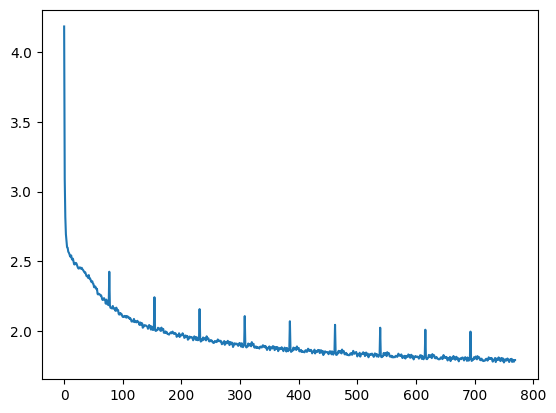

In [44]:
import matplotlib.pyplot as plt
plt.plot(train_loss_list)

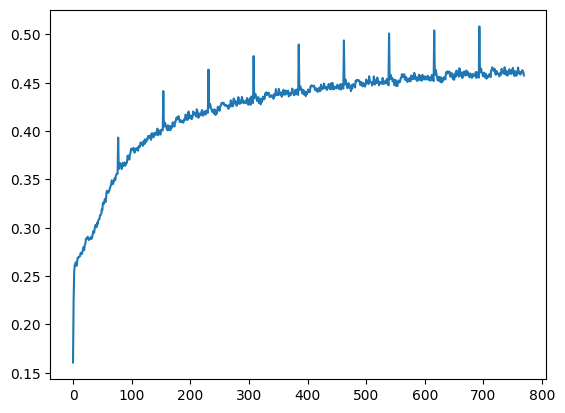

In [45]:
plt.plot(train_acc_list)

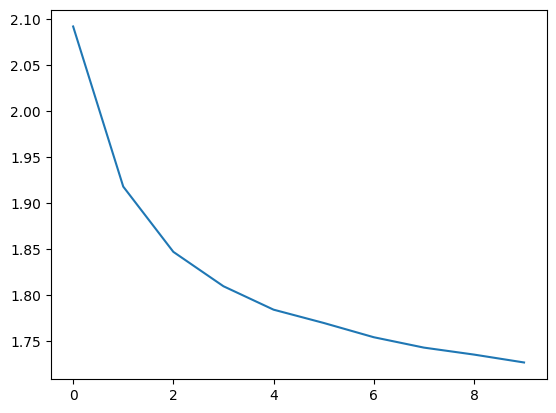

In [46]:
plt.plot(eval_loss_list)

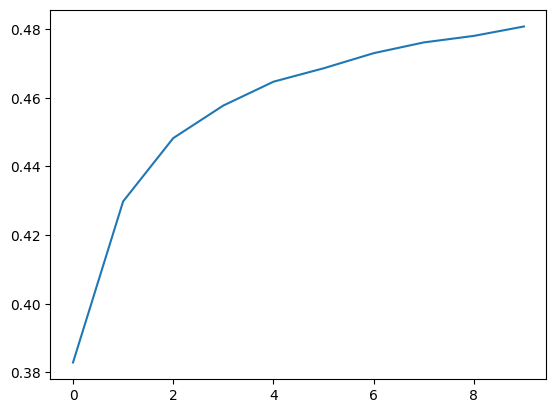

In [47]:
plt.plot(eval_acc_list)

In [50]:
from torch.distributions import Categorical

In [52]:
pred_sent = 'd'
current_char = [pred_sent]
model.eval()
embed = get_embedding(current_char)
# embed = np.concatenate([embed, np.zeros((5,))], axis=0)
for i in range(seq_len):
    data = torch.from_numpy(embed.reshape((1,1,-1))).type(torch.FloatTensor).to(device)
    data = torch.permute(data, (1, 0, 2))
    output = model(data)
    # print(output[:,:,:123].shape)
    dist = Categorical(output)
    index = dist.sample()
    # print(index)
    pred = index
    embed = onehot_enc.transform(pred.cpu().numpy().reshape((-1,1))).reshape(-1,)
    # embed = np.concatenate([embed, np.zeros((5,))], axis=0)
    # print(embed.shape)
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)

d};0”ý™•ôE9[ÇœÇc]Qcë9/Osæ#æs{HzU﻿J!Oý•Q7&Á#&L_YJz'óœE[á$Z9àÉbë{îIm3VäÁ=IýœR·üuT)=51U-$lèAxäëi*’9‘Çí‘Á“àZ7•G(—…V﻿Yî”í;ç-)IëHOX?!3t


In [53]:
pred_sent = 't'
current_char = [pred_sent]
model.eval()
embed = get_embedding(current_char)
# embed = np.concatenate([embed, np.zeros((5,))], axis=0)
for i in range(seq_len):
    data = torch.from_numpy(embed.reshape((1,1,-1))).type(torch.FloatTensor).to(device)
    data = torch.permute(data, (1, 0, 2))
    output = model(data)
    _,pred = torch.max(output.reshape(-1,ntokens),1)
    embed = onehot_enc.transform(pred.cpu().numpy().reshape((-1,1))).reshape(-1,)
    # embed = np.concatenate([embed, np.zeros((5,))], axis=0)
    # print(embed.shape)
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)

the the the the the the the the the the the the the the the the the the the the the the the the the the the the the the the the t


In [54]:
torch.save(model, 'finalmodel_hw3_p3_transformer_v2.pt')

In [56]:

pred_sent = 'the world is bea'
# one_book_char_list = []
# for i, sample in enumerate(pred_sent):
#     one_book_char_list.append(sample)
# embed = get_embedding(one_book_char_list)
# embed = np.concatenate([embed, np.zeros((embed.shape[0], 5))], axis=1)
for i in range(1024):
    one_book_char_list = []
    for j, sample in enumerate(pred_sent):
        one_book_char_list.append(sample)
    embed = get_embedding(one_book_char_list)
    # embed = np.concatenate([embed, np.zeros((embed.shape[0], 5))], axis=1)
    data = torch.from_numpy(embed.reshape((1, embed.shape[0],embed.shape[1]))).type(torch.FloatTensor).to(device)
    data = torch.permute(data, (1, 0, 2))
    output = model(data)
    _,pred = torch.max(output[-1,:,:].reshape(1,123),1)
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)

the world is bear the same the same the was the the sall
the come the come the come the could not the come the could the she was the he was the the se was the the wat the the he wathe he he he wathe he he he he he he he he had
sad had he had sad sthe sthe sthe sthe sthe se sthe se se se salalad te te te the the the the the se se the se se the seathe se se sealathe the the se the se se the se se the se to the the se se the sealathe the the se se the se the se se the seathe se the se se the sealathe the se the se the se se the seare the the se seare the the se the se seare the the sthe se seare the sthe seare the se the seare the sthe se seare the the se sthe seare the seare the the se the seare the sthe seare the se the seare the sthe seare the se the seare the the seare the seare the the se sthe seare the seare
theare seare the se theare the se seare the the se sthe seare the seare the the se theare
theare se seare the se seare the the seare the the se seare the the se seare the the se

In [57]:
pred_sent = 'Sue and Johnsy lived at the top of a building with three floors. they discovered that they liked the same kind of art, the same kind of food'
for i in range(1024):
    one_book_char_list = []
    for j, sample in enumerate(pred_sent):
        one_book_char_list.append(sample)
    embed = get_embedding(one_book_char_list)
    # embed = np.concatenate([embed, np.zeros((embed.shape[0], 5))], axis=1)
    data = torch.from_numpy(embed.reshape((1, embed.shape[0],embed.shape[1]))).type(torch.FloatTensor).to(device)
    data = torch.permute(data, (1, 0, 2))
    output = model(data)
    _,pred = torch.max(output[-1,:,:].reshape(1,123),1)
    pred_sent +=ord_enc.inverse_transform(pred.cpu().numpy().reshape((-1,1)))[0][0]
print(pred_sent)

Sue and Johnsy lived at the top of a building with three floors. they discovered that they liked the same kind of art, the same kind of food
the she was the she was the had the same the was the the salll the the se was
the she salll the the se she sare the sto the se sere to the seare the sthe se ware the the se the se sto the se to the se the sereare the ware the the the sthe se se ware the the the the sthe se se sthe se ware the the the sthe sthe sthe se sthe se sto se sto are
the are are are are the the the are the the sthe sthe sthe sthe sthe sthe sthe sthe se se sthe se se sthe se sthe se se athe sthe sto athe sthe sthe se se sto athe sthe sthe se se athe sthe sthe se se sto athe sthe sthe se se athe sthe se sto athe sthe sthe se se athe sthe se sthe se se se ato athe sthe sthe sthe se sthe se se se ato athe sthe sthe sthe se se sto se athe sthe sthe se se se se ato athe sthe sthe sthe se se se sto athe sthe se se sto are are are are are are are are the the the the sthe sthe sthe 